In [62]:
%matplotlib inline

import pandas as pd
import numpy as np
import glob
from scipy.misc import imread
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import seaborn as sns

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss

from keras.models import Sequential
from keras.models import Model
from keras.models import load_model
from keras.layers.core import Dense, Dropout, Flatten
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping
from keras.utils import np_utils
from keras import __version__ as keras_version
from keras.applications.resnet50 import ResNet50
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.preprocessing import image
from keras import backend as K

from PIL import Image

new_style = {'grid': False}
plt.rc('axes', **new_style)
p = sns.color_palette()

In [4]:
INPUT_WIDTH = 224
INPUT_HEIGHT = 224
DATA_PATH = '/a/data/fisheries_monitoring/data/'
labels = pd.read_csv(DATA_PATH + 'localizers/original/superboxes.csv',names = ["img", "x","y","w","h"])
labels = labels.sort_values(by = "img")

In [5]:
def load_raw_data():
    raw_data = []
    raw_index = []
    raw_boxes = []
    for i in xrange(len(labels)):
        file_name = labels.iloc[i]["img"]
        path = DATA_PATH + 'localizers/original/' + file_name
        img = imread(path)
        box = labels.iloc[i][["x","y","w","h"]].values.astype(dtype = 'float32')
        raw_data.append(img)
        raw_index.append(file_name)
        raw_boxes.append(box)
        if (i+1) in [k*len(labels)/5 for k in xrange(1,6)]:
            print "Loading...{}% done!".format((i+2)*100/len(labels))
    return raw_data, raw_boxes, raw_index

In [6]:
def resize_data_and_boxes(raw_data, raw_boxes, raw_index, INPUT_WIDTH, INPUT_HEIGHT):
    resized_data = []
    resized_boxes = []
    for i in xrange(len(raw_data)):
        path = DATA_PATH + 'localizers/original/' + raw_index[i]
        old_width = raw_data[i].shape[1]
        old_height = raw_data[i].shape[0]
        old_x, old_y, old_w, old_h = raw_boxes[i]
        
        img = image.load_img(path, target_size=(INPUT_WIDTH, INPUT_HEIGHT))
        img = image.img_to_array(img)
        resized_data.append(img)
        
        new_x = old_x * INPUT_WIDTH / old_width
        new_y = old_y * INPUT_HEIGHT / old_height
        new_w = old_w * INPUT_WIDTH / old_width
        new_h = old_h * INPUT_HEIGHT / old_height
        resized_boxes.append(np.array([new_x, new_y, new_w, new_h]))
        if (i+1) in [k*len(raw_data)/5 for k in xrange(1,6)]:
            print "Resizing data and boxes...{}% done!".format((i+2)*100/len(raw_data))
    
    resized_data = np.array(resized_data)
    resized_data /= 255
    resized_boxes = np.array(resized_boxes)
    resized_index = np.array(raw_index)
    
    return resized_data, resized_boxes, resized_index

In [7]:
def visualize_prediction(img, true_box, pred_box = None):
    _, ax = plt.subplots(1, 1, figsize=(60, 9))
    ax.imshow(img)
    x, y, width, height = true_box
    ax.add_patch(
    patches.Rectangle(
        (x, y), # x,y
        width, # width
        height, # height
        hatch='\\',
        fill=False      # remove background
            )
        )
    if pred_box is not None:
        x, y, width, height = pred_box
        ax.add_patch(
        patches.Rectangle(
            (x, y), # x,y
            width, # width
            height, # height
            hatch='-',
            fill=False      # remove background
                )
            )

In [8]:
raw_data, raw_target, raw_index = load_raw_data()
train_data, train_target, train_index = resize_data_and_boxes(raw_data, raw_target, raw_index, INPUT_WIDTH, INPUT_HEIGHT)
X_train, X_test, y_train, y_test, id_train, id_test = train_test_split(train_data, train_target, train_index, test_size=0.2, random_state=0)
print "All train data: ", train_data.shape
print "All train target: ", train_target.shape
print "Training set: ", X_train.shape
print "Training label: ", y_train.shape
print "Test set: ", X_test.shape
print "Test label:", y_test.shape

Loading...20% done!
Loading...40% done!
Loading...60% done!
Loading...80% done!
Loading...100% done!
Resizing data and boxes...20% done!
Resizing data and boxes...40% done!
Resizing data and boxes...60% done!
Resizing data and boxes...80% done!
Resizing data and boxes...100% done!
All train data:  (3310, 224, 224, 3)
All train target:  (3310, 4)
Training set:  (2648, 224, 224, 3)
Training label:  (2648, 4)
Test set:  (662, 224, 224, 3)
Test label: (662, 4)


## Visualizing data and boxes

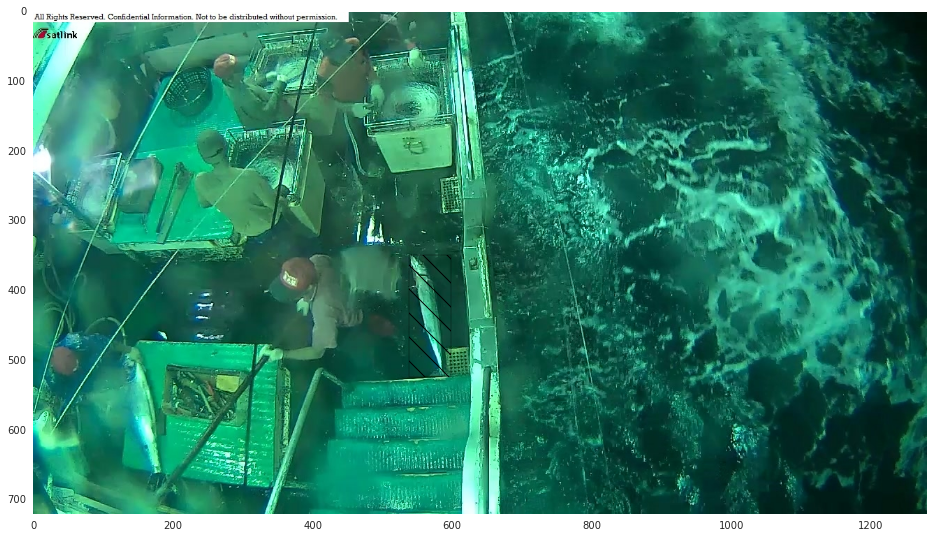

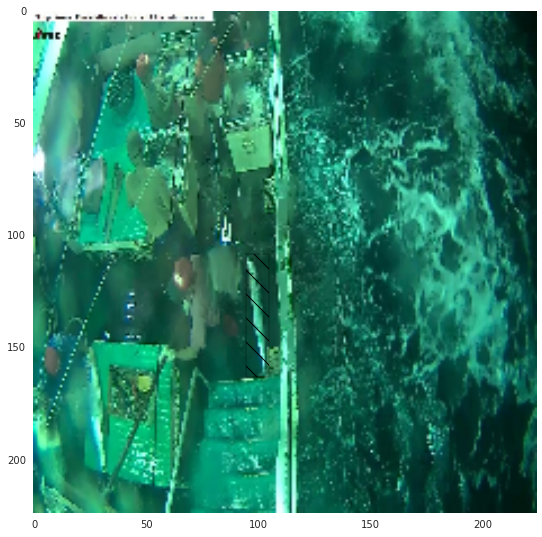

In [9]:
n = np.random.choice(len(train_data))
visualize_prediction(raw_data[n], raw_target[n])
visualize_prediction(train_data[n], train_target[n])

## Define model

In [35]:
base_model = ResNet50(weights='imagenet', include_top = False, input_shape=(224,224,3))

x = base_model.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(4)(x)
model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer='adam', loss='mean_squared_error')

## Start training

In [84]:
batch_size = 16
nb_epoch = 50
random_state = 51

callbacks = [EarlyStopping(monitor='val_loss', patience=3, verbose=0),]
model.fit(X_train, y_train, batch_size=batch_size, nb_epoch=nb_epoch, shuffle=True,
          verbose=2, validation_data=(X_test, y_test), callbacks = callbacks)
model.save(DATA_PATH + 'models/localizers/localizer_ResNet50_SuperBox.h5')

Train on 2648 samples, validate on 662 samples
Epoch 1/50
116s - loss: 127.6206 - val_loss: 115.2406
Epoch 2/50
114s - loss: 118.8692 - val_loss: 114.9953
Epoch 3/50
112s - loss: 108.7608 - val_loss: 140.6326
Epoch 4/50
114s - loss: 111.2198 - val_loss: 163.4462
Epoch 5/50
120s - loss: 98.2792 - val_loss: 121.0082
Epoch 6/50
124s - loss: 99.2859 - val_loss: 113.6511
Epoch 7/50
127s - loss: 98.6496 - val_loss: 127.8799
Epoch 8/50
122s - loss: 88.6315 - val_loss: 144.1938
Epoch 9/50
129s - loss: 92.6383 - val_loss: 138.8643
Epoch 10/50
116s - loss: 85.8073 - val_loss: 130.5705


/a/h/jli04/Envs/deep-venv/lib/python2.7/site-packages/ipykernel/__main__.py:7: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.


## Prediction and visualization

In [85]:
#model = load_model(DATA_PATH + 'models/localizers/localizer_ResNet50_SuperBox.h5')
batch_size = 16
y_pred = model.predict(X_test.astype('float32'), batch_size=batch_size, verbose=2)

In [86]:
def transform_prediction(X_test, y_pred, id_test, INPUT_WIDTH, INPUT_HEIGHT):
    ind = []
    boxes = []
    for i in xrange(len(X_test)):
        n = np.where(train_index == id_test[i])[0][0]
        ind.append(n)
        
        height, width, _ = raw_data[n].shape
        old_x, old_y, old_w, old_h = y_pred[i]
        new_x = old_x * width / INPUT_WIDTH
        new_y = old_y * height / INPUT_HEIGHT
        new_w = old_w * width / INPUT_WIDTH
        new_h = old_h * height / INPUT_HEIGHT
        boxes.append(np.array([new_x, new_y, new_w, new_h]))
    return np.array(ind), np.array(boxes)

ind, boxes = transform_prediction(X_test, y_pred, id_test, INPUT_WIDTH, INPUT_HEIGHT)

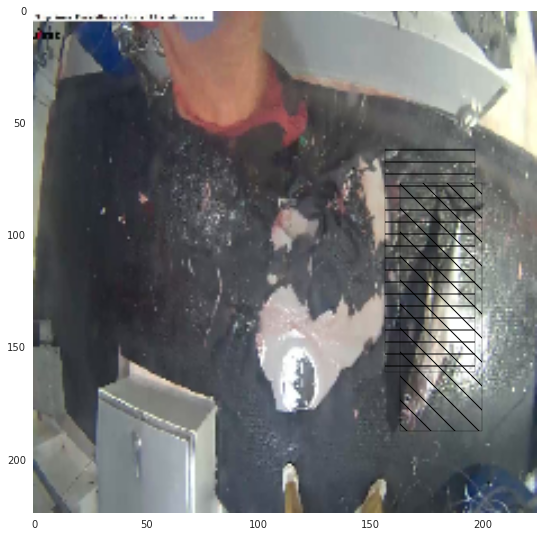

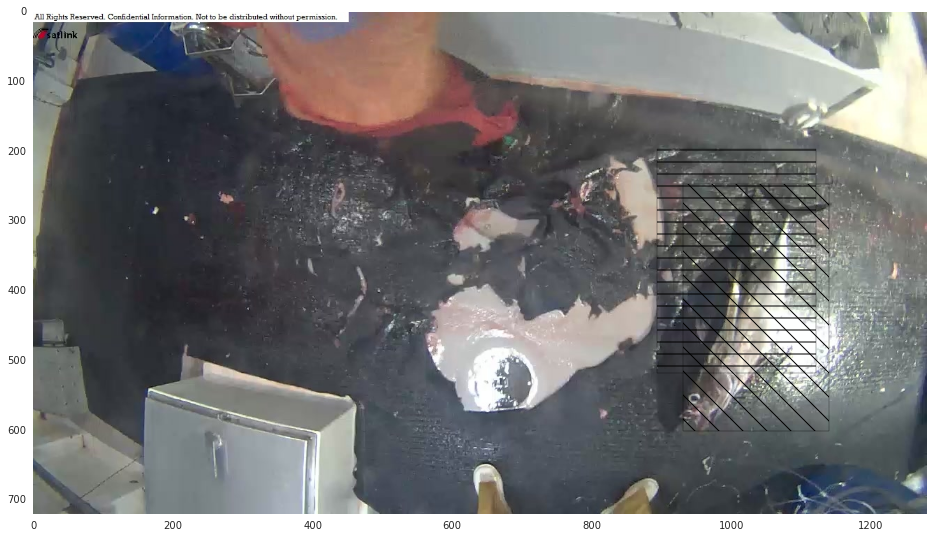

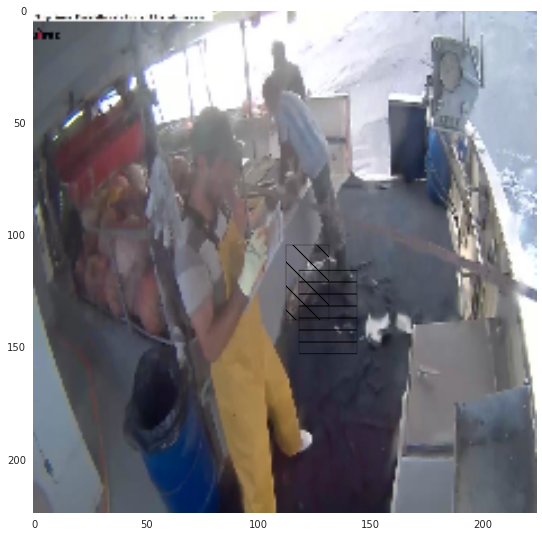

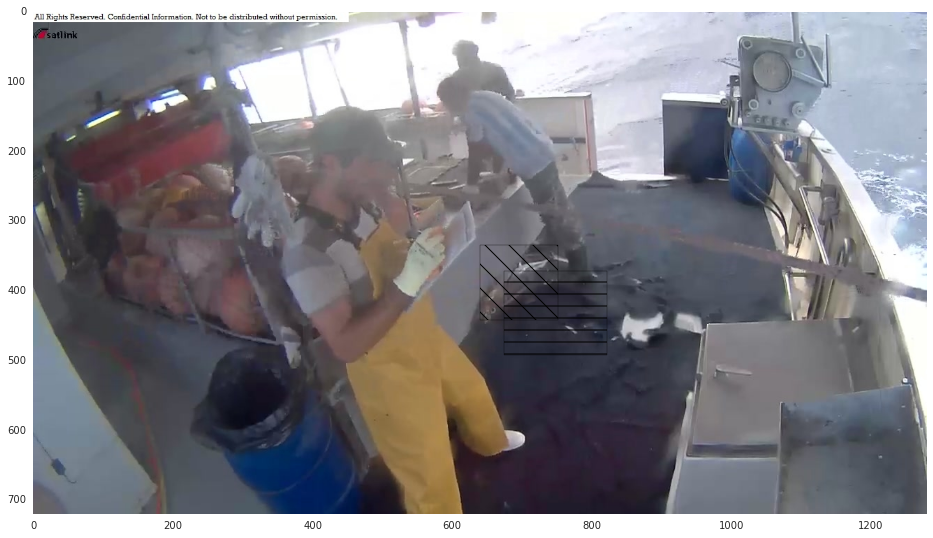

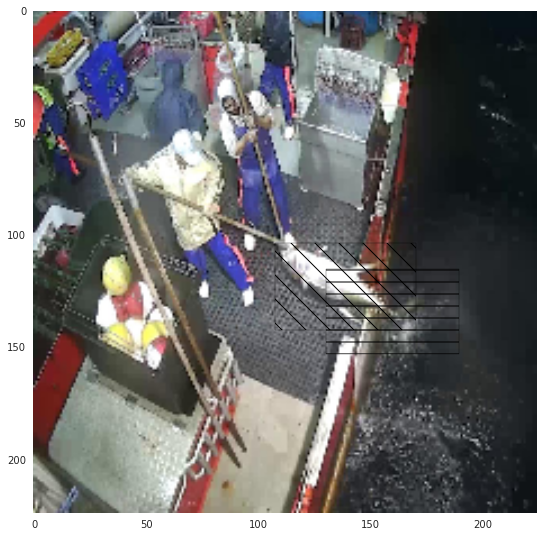

...

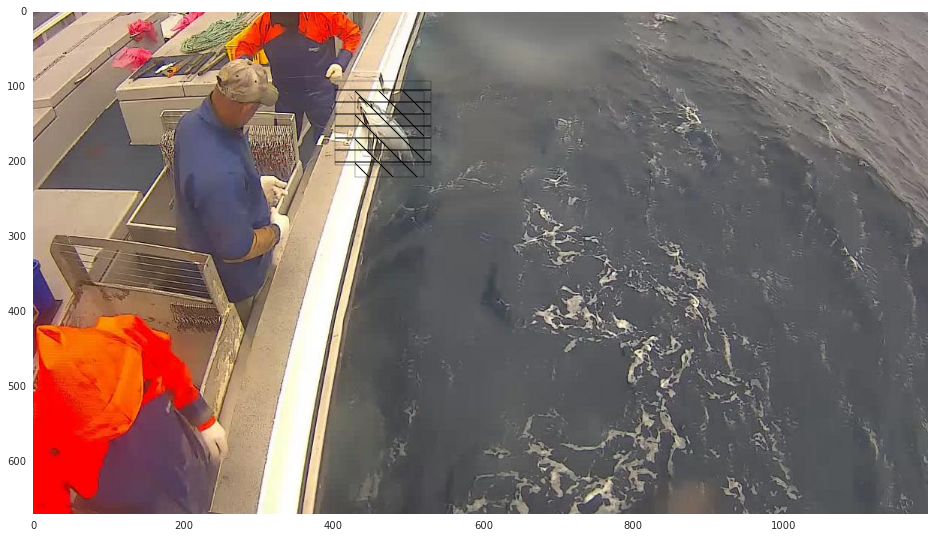

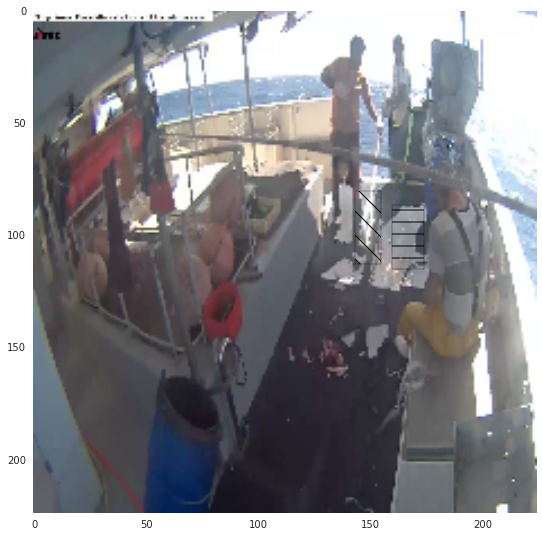

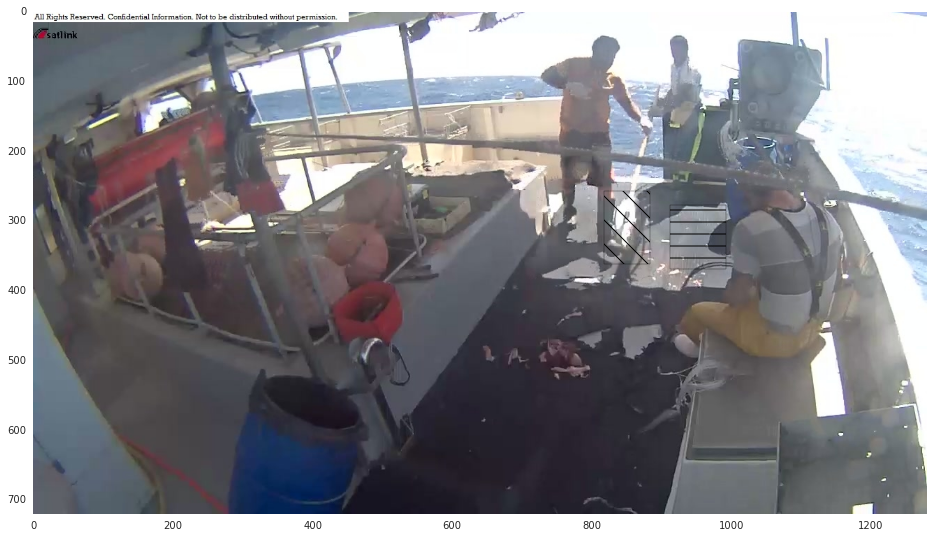

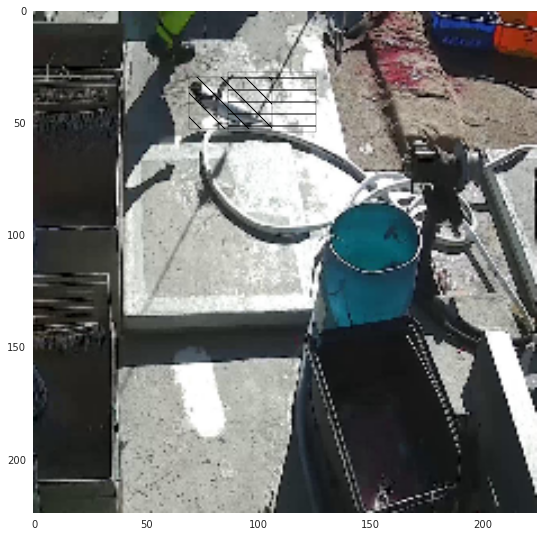

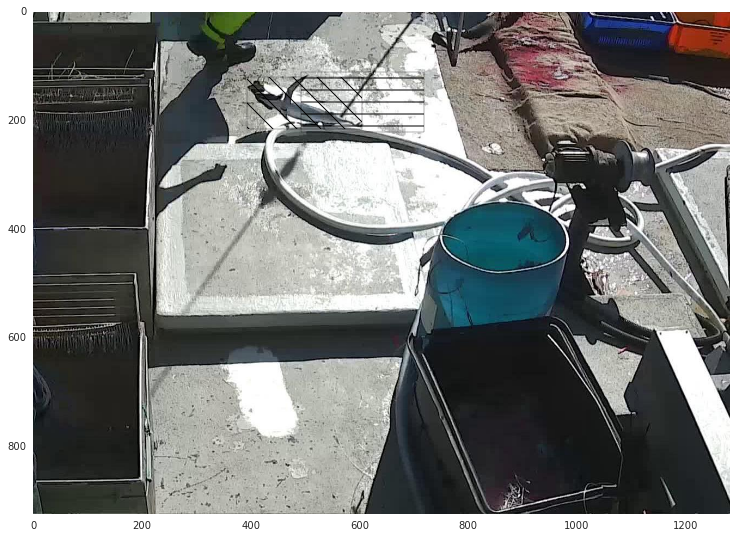

In [88]:
# The true boxes have the patch pattern of '\\' and predicted boxes have the patch pattern of '-'
for i in xrange(10):
    n = np.random.choice(len(X_test))
    visualize_prediction(X_test[n], y_test[n], y_pred[n])
    visualize_prediction(raw_data[ind[n]], raw_target[ind[n]], boxes[n])

In [69]:
# Crop all the fishes and save them as separate files.

def crop_all_fishes(raw_index, ind, boxes):
    for i in xrange(len(ind)):
        file_name = DATA_PATH + 'localizers/original/' + raw_index[ind[i]]
        img = Image.open(file_name)
        
        x, y, width, height = boxes[i]
        left = int(round(x))
        right = int(round(x + width))
        top = int(round(y))
        bottom = int(round(y + height))

        img_new = img.crop((left, top, right, bottom))
        img_new.save(DATA_PATH + "cropped_data/localizer_ResNet50_SuperBox/" + raw_index[ind[i]] + '.jpg')
crop_all_fishes(raw_index, ind, boxes)